C:\Users\ansankar\AppData\Local\Temp\ipykernel_27452\817148160.py:6: DtypeWarning:

Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.



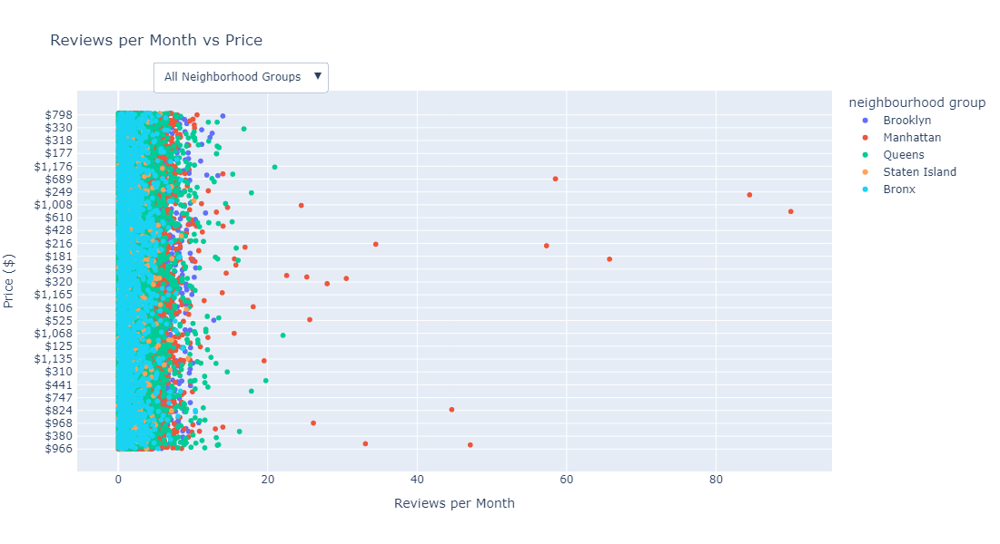

In [6]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Load and clean the data
df = pd.read_csv("C://Users//ansankar//Downloads//Airbnb_Open_Data (2).csv")
df['neighbourhood group'] = df['neighbourhood group'].replace({
    'brookln': 'Brooklyn',
    'manhatan': 'Manhattan',
    'bronx': 'Bronx',
    'queens': 'Queens',
    'staten island': 'Staten Island'
}, regex=True)

# 1. Price Distribution by Neighborhood Group and Room Type
#fig1 = px.box(df, x='neighbourhood group', y='price', color='room type',
 #              title='Price Distribution by Neighborhood Group and Room Type',
  #             labels={'neighbourhood group': 'Neighborhood Group', 'price': 'Price ($)'},
   #            height=600)

#fig1.update_layout(updatemenus=[
 #   dict(
  #      buttons=list([
   #         dict(label="All Room Types",
    #             method="update",
     #            args=[{"visible": [True] * len(fig1.data)}]),
      #      dict(label="Entire home/apt",
       #          method="update",
        #         args=[{"visible": [trace.name == "Entire home/apt" for trace in fig1.data]}]),
         #   dict(label="Private room",
          #       method="update",
           #      args=[{"visible": [trace.name == "Private room" for trace in fig1.data]}]),
            #dict(label="Shared room",
             #    method="update",
              #   args=[{"visible": [trace.name == "Shared room" for trace in fig1.data]}]),
        #]),
        #direction="down",
        #pad={"r": 10, "t": 10},
        #showactive=True,
        #x=0.1,
        #xanchor="left",
        #y=1.1,
        #yanchor="top"
    #,
#])

#fig1.show()

# 2. Reviews per Month vs Price Scatter Plot
fig2 = px.scatter(df, x='reviews per month', y='price', color='neighbourhood group',
                  title='Reviews per Month vs Price',
                  labels={'reviews per month': 'Reviews per Month', 'price': 'Price ($)'},
                  height=600)

fig2.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(label="All Neighborhood Groups",
                     method="update",
                     args=[{"visible": [True] * len(df['neighbourhood group'].unique())}]),
            ] + [
                dict(label=group,
                     method="update",
                     args=[{"visible": [df['neighbourhood group'] == group]}])
                for group in df['neighbourhood group'].unique() if pd.notna(group)
            ],
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.1,
            yanchor="top"
        ),
    ]
)

fig2.show()

